<a href="https://colab.research.google.com/github/fsl60/DataAnalysis/blob/main/EarthquackAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff

In [5]:
data = pd.read_csv(r"seismic_data.csv",index_col='Date(UTC)')

In [6]:
data.head()

,Latitude,Longitude,Depth,Magnitude
Date(UTC),,,,
2024-09-24 14:24:24,-25.93,-71.15,50,5.3
2024-09-23 02:36:38,-29.73,-71.19,65,5.5
2024-09-22 18:46:38,-32.04,-71.46,60,5.2
2024-09-06 10:12:56,-28.69,-69.56,128,5.7
2024-09-05 10:38:28,-19.13,-67.65,245,5.5


In [9]:
data.describe()

,Latitude,Longitude,Depth,Magnitude
count,3885.000000,3885.000000,3885.000000,3885.000000
mean,-27.733194,-70.837653,61.527156,4.430270
std,5.906063,1.292991,38.391220,0.684547
min,-62.350000,-75.730000,2.000000,2.300000
25%,-31.770000,-71.580000,36.000000,4.000000
50%,-29.570000,-71.170000,50.000000,4.400000
75%,-21.390000,-70.020000,87.000000,4.800000
max,-11.070000,-58.390000,624.000000,8.400000


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3885 entries, 2024-09-24 14:24:24 to 2012-03-03 11:01:47
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Latitude   3885 non-null   float64
 1   Longitude  3885 non-null   float64
 2   Depth      3885 non-null   int64  
 3   Magnitude  3885 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 280.8+ KB


In [12]:
px.scatter(data,x='Latitude',y='Longitude',size="Magnitude").show()

In [13]:
px.scatter_3d(data,x="Latitude",y="Longitude",z="Magnitude",color="Depth").show()

In [21]:
import folium
from IPython.display import display


# Create a folium map centered on Chile
chile_map = folium.Map(location=[-35.6751, -71.5430], zoom_start=5)

# Loop through each row in the DataFrame and add markers
for _, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Location: <br>Magnitude: {row['Magnitude']}",
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(chile_map)

# Save the map as an HTML file
chile_map.save("chile_earthquake_map.html")


In [22]:
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=row['Magnitude'] * 2,
        popup=f"Location: <br>Magnitude: {row['Magnitude']}",
        color='crimson',
        fill=True,
        fill_color='crimson'
    ).add_to(chile_map)


In [23]:
display(chile_map)


In [24]:
px.scatter(data, y='Depth', size='Magnitude')

In [25]:
px.density_heatmap(data, x="Depth", y="Magnitude", marginal_x="violin", marginal_y="violin")

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt


<Axes: xlabel='Depth', ylabel='Count'>

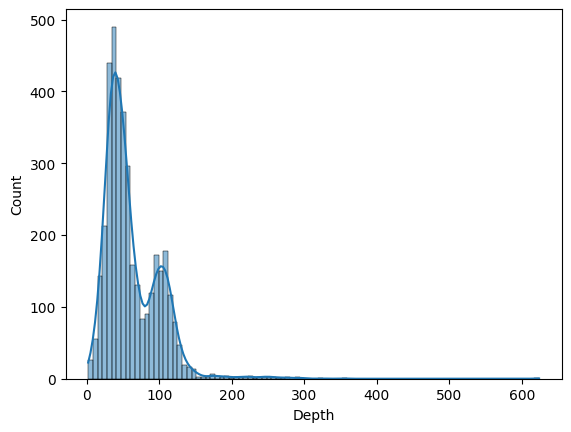

In [35]:
sns.histplot(data=data, x="Depth",kde=True)

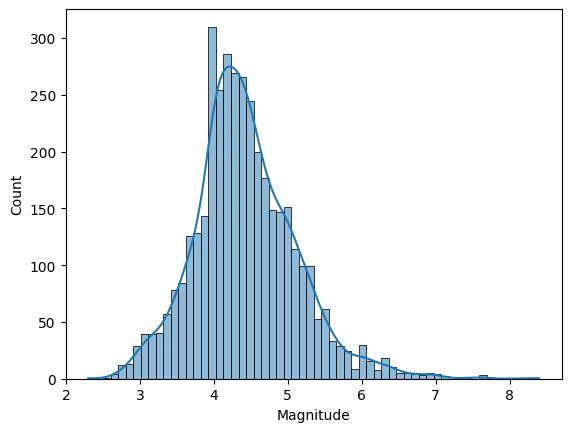

In [27]:
sns.histplot(data=data, x='Magnitude', kde=True);

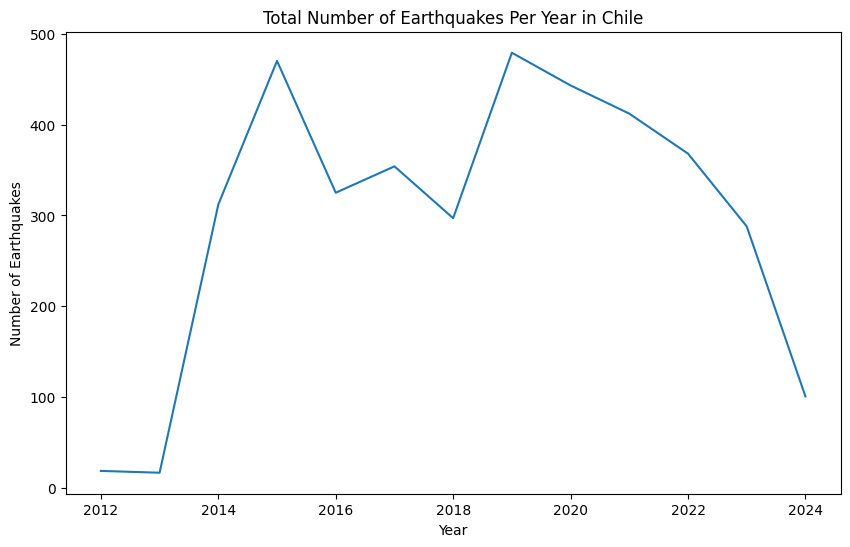

In [34]:
data.index = pd.to_datetime(data.index)

# Extract the year from the 'Date(UTC)' column
data['Year'] = data.index.year
earthquake_counts_per_year = data.groupby('Year').size()

earthquake_counts_per_year.plot(kind='line', figsize=(10, 6))

plt.xlabel('Year')
plt.ylabel('Number of Earthquakes')
plt.title('Total Number of Earthquakes Per Year in Chile')
plt.show()


In [37]:
import numpy as np

samples = 10_000

if samples > len(data):
    samples = len(data)

index = np.random.choice(data.index, samples, replace=False)  # Use replace=False to avoid duplicates
_ = data.loc[index]  # Use loc to select by index

# Extract Depth
depth = _.Depth

# Classify depth into categories
family = np.select([depth < 80, depth < 160], ['shallow', 'deep'], default='extreme')

# Central Chile coordinates
central_chile = {'lat': -27.927, 'lon': -70.174}

# Create a scatter mapbox
fig = px.scatter_mapbox(
    _,
    lat='Latitude',
    lon='Longitude',
    color=family,
    center=central_chile,
    mapbox_style='open-street-map',
    height=800,
    width=800,
    zoom=4
)

fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

fig.show()


Here Red colors indicate shallow depth, Blue color indicate moderate deep depth, and Green color indicates extreme depth.